<a href="https://colab.research.google.com/github/NikSavilov/yawning-detection-baseline/blob/main/yawning_detection_baseline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip -q install timm pydicom catalyst
!pip -q install albumentations==0.4.6

import sys 
from glob import glob
from sklearn.model_selection import GroupKFold, StratifiedKFold
import cv2
from skimage import io
import torch
from torch import nn
import os
from datetime import datetime
import time
import random
import cv2
import torchvision
from torchvision import transforms
import pandas as pd
import numpy as np
from tqdm import tqdm

import matplotlib.pyplot as plt
from torch.utils.data import Dataset,DataLoader
from torch.utils.data.sampler import SequentialSampler, RandomSampler
from torch.cuda.amp import autocast, GradScaler
from torch.nn.modules.loss import _WeightedLoss
import torch.nn.functional as F

import timm

import sklearn
import warnings
import joblib
from sklearn.metrics import roc_auc_score, log_loss
from sklearn import metrics
import warnings
import cv2
import pydicom
#from efficientnet_pytorch import EfficientNet
from scipy.ndimage.interpolation import zoom

# Albumentations
from albumentations import (
    HorizontalFlip, VerticalFlip, IAAPerspective, ShiftScaleRotate, CLAHE, RandomRotate90,
    Transpose, ShiftScaleRotate, Blur, OpticalDistortion, GridDistortion, HueSaturationValue, RGBShift,
    IAAAdditiveGaussianNoise, GaussNoise, MotionBlur, MedianBlur, IAAPiecewiseAffine, RandomResizedCrop,
    IAASharpen, IAAEmboss, RandomBrightnessContrast, Flip, OneOf, Compose, Normalize, Cutout, CoarseDropout, ShiftScaleRotate, CenterCrop, Resize
)

from albumentations.pytorch import ToTensorV2
%matplotlib inline

     |████████████████████████████████| 296kB 16.7MB/s 
     |████████████████████████████████| 1.9MB 54.0MB/s 
     |████████████████████████████████| 460kB 53.3MB/s 
     |████████████████████████████████| 317kB 53.1MB/s 
     |████████████████████████████████| 122kB 17.5MB/s 
     |████████████████████████████████| 952kB 31.6MB/s 


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
!unzip -q /content/drive/MyDrive/yawn/yawning-detection.zip -d yawning-detection

Mounted at /content/drive


In [ ]:
!nvidia-smi

Tue Mar 23 16:48:20 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.56       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

**One time eval classes and functions, not using CFG.**

In [ ]:
class YawningImgClassifier(nn.Module):
    def __init__(self, model_arch, n_class, pretrained=False):
        super().__init__()
        self.model = timm.create_model(model_arch, pretrained=pretrained)
        n_features = self.model.classifier.in_features
        self.model.classifier = nn.Linear(n_features, n_class)

    def forward(self, x):
        x = self.model(x)
        return x

def inference_one_epoch(model, data_loader, device):
    model.eval()

    image_preds_all = []
    
    pbar = tqdm(enumerate(data_loader), total=len(data_loader))
    for step, (imgs) in pbar:
        imgs = imgs.to(device).float()
        
        image_preds = model(imgs)   #output = model(input)
        image_preds_all += [torch.softmax(image_preds, 1).detach().cpu().numpy()]
        
    
    image_preds_all = np.concatenate(image_preds_all, axis=0)
    return image_preds_all

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True
    
def get_img(path):
    im_bgr = cv2.imread(path)
    im_rgb = im_bgr[:, :, ::-1]
    #print(im_rgb)
    return im_rgb

# img = get_img('./yawning-detection/train/123456 (1201).jpg')
# plt.imshow(img)
# plt.show()

def rand_bbox(size, lam):
    W = size[0]
    H = size[1]
    cut_rat = np.sqrt(1. - lam)
    cut_w = np.int(W * cut_rat)
    cut_h = np.int(H * cut_rat)

    # uniform
    cx = np.random.randint(W)
    cy = np.random.randint(H)

    bbx1 = np.clip(cx - cut_w // 2, 0, W)
    bby1 = np.clip(cy - cut_h // 2, 0, H)
    bbx2 = np.clip(cx + cut_w // 2, 0, W)
    bby2 = np.clip(cy + cut_h // 2, 0, H)
    return bbx1, bby1, bbx2, bby2




In [ ]:
class MyCrossEntropyLoss(_WeightedLoss):
    def __init__(self, weight=None, reduction='mean'):
        super().__init__(weight=weight, reduction=reduction)
        self.weight = weight
        self.reduction = reduction

    def forward(self, inputs, targets):
        lsm = F.log_softmax(inputs, -1)

        if self.weight is not None:
            lsm = lsm * self.weight.unsqueeze(0)

        loss = -(targets * lsm).sum(-1)

        if  self.reduction == 'sum':
            loss = loss.sum()
        elif  self.reduction == 'mean':
            loss = loss.mean()

        return loss

In [ ]:
train = pd.read_csv('./yawning-detection/train.csv')
submission = pd.read_csv('./yawning-detection/sample_submission.csv')

train.head()
train.label.value_counts()
# submission.head()

0    2692
1    2550
Name: label, dtype: int64

In [ ]:
# TRAIN
TRAIN_CFG = {
    'fold_num': 3,
    'seed': 719,
    'model_arch': 'tf_efficientnet_b4_ns',
    'img_size': 380,
    'epochs': 30,
    'loss_func_class': nn.BCELoss,
    'train_bs': 16,
    'valid_bs': 32,
    'T_0': 10,
    'lr': 0.0001,
    'min_lr': 1e-5,
    'weight_decay':1e-6,
    'num_workers': 4,
    'accum_iter': 2, # suppoprt to do batch accumulation for backprop with effectively larger batch size
    'verbose_step': 1,
    
    'device': 'cuda:0'
}

#INFERENCE

INFERENCE_CFG = {
    'fold_num': 3,
    'seed': 719,
    'model_arch': 'tf_efficientnet_b4_ns',
    'img_size': 380,
    'epochs': 30,
    'train_bs': 32,
    'valid_bs': 32,
    'lr': 0.667e-4,
    'num_workers': 4,
    'accum_iter': 1, # suppoprt to do batch accumulation for backprop with effectively larger batch size
    'verbose_step': 1,
    'device': 'cuda:0',
    'tta': 3,
    'used_epochs': [26, 27, 28, 29],
    'weights': [1,1,1,1]
}

CFG = TRAIN_CFG
# CFG = INFERENCE_CFG

**DATASET**


In [ ]:
class A:
  vars = []
from PIL import Image
a=A()

In [ ]:
for plt_im in images_glabal_var:
    plt.imshow(to_pil)
    plt.show()

In [ ]:
a.vars

[]

In [ ]:
class YawningDataset(Dataset):
    def __init__(self, df, root_dir, 
                 transforms=None, 
                 output_label=True, 
                 one_hot_label=False,
                 do_fmix=False, 
                 fmix_params={
                     'alpha': 1., 
                     'decay_power': 3., 
                     'shape': (CFG['img_size'], CFG['img_size']),
                     'max_soft': True, 
                     'reformulate': False
                 },
                 do_cutmix=False,
                 cutmix_params={
                     'alpha': 1,
                 }
                ):
        
        super().__init__()

        self.df = df.reset_index(drop=True).copy()
        self.transforms = transforms
        self.root_dir = root_dir
        self.do_fmix = do_fmix
        self.fmix_params = fmix_params
        self.do_cutmix = do_cutmix
        self.cutmix_params = cutmix_params
        
        self.output_label = output_label
        self.one_hot_label = one_hot_label
        self.img_plot_counter = 0
        
        if output_label == True:
            self.labels = self.df['label'].values
            #print(self.labels)
            
            if one_hot_label is True:
                self.labels = np.eye(self.df['label'].max()+1)[self.labels]
                #print(self.labels)
            
    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        if self.output_label:
            target = self.labels[idx]

        img_name = os.path.join(self.root_dir,
                                self.df.iloc[idx, 0].split('\\')[-1])
        img = get_img(img_name)
        if self.transforms:
            img = self.transforms(image=img)['image']
            # if self.img_plot_counter < 50:
            #     #img_float = np.float(img)
            #     img_copy = img.numpy().swapaxes(0, 2)
            #     to_pil = Image.fromarray(img_copy, 'RGB')
            #     to_pil.save('/content/transformed/'+ img_name.split('/')[-1])

            #     # plt.imshow(to_pil)
            #     # plt.show()
            #     self.img_plot_counter+=1

            #img = img
           

        if self.output_label == True:
            return img, target
        else:
            return img

def get_train_transforms():
    return Compose([
            RandomResizedCrop(CFG['img_size'], CFG['img_size'], (0.95,0.99)),
            # Resize(CFG['img_size'], CFG['img_size']),
            # Transpose(p=0.5),
            OpticalDistortion(0.3),
            HorizontalFlip(p=0.5),
            ShiftScaleRotate(p=0.5),
            # RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=0.5),
            # HueSaturationValue(hue_shift_limit=0.2, sat_shift_limit=0.2, val_shift_limit=0.2, p=0.5),
            RandomBrightnessContrast(brightness_limit=(-0.4,0.4), contrast_limit=(-0.4, 0.4), p=0.5),
            CLAHE(clip_limit=(3, 4), always_apply=True),
            # Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], max_pixel_value=255.0, p=1.0),
            # Cutout(p=0.5),
            CoarseDropout(max_height=30, max_width=30, p=0.5),
            ToTensorV2(p=1.0),
        ], p=1.)
  
        
def get_valid_transforms():
    return Compose([
            # CenterCrop(CFG['img_size'], CFG['img_size'], p=1.),
            Resize(CFG['img_size'], CFG['img_size']),
            CLAHE(clip_limit=(3, 4), always_apply=True),
            # Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], max_pixel_value=255.0, p=1.0),
            ToTensorV2(p=1.0),
        ], p=1.)
    

def get_inference_transforms():
    return Compose([
            Resize(CFG['img_size'], CFG['img_size']),
            CLAHE(clip_limit=(3, 4), always_apply=True),
            # Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], max_pixel_value=255.0, p=1.0),
            ToTensorV2(p=1.0),
        ], p=1.)

In [ ]:
#TRAIN
def prepare_dataloader(df, trn_idx, val_idx, data_root='./yawning-deteciton/train/'):
    
    from catalyst.data.sampler import BalanceClassSampler
    
    train_ = df.loc[trn_idx,:].reset_index(drop=True)
    valid_ = df.loc[val_idx,:].reset_index(drop=True)
        
    train_ds = YawningDataset(train_, data_root, transforms=get_train_transforms(), output_label=True, one_hot_label=False, do_fmix=False, do_cutmix=False)
    valid_ds = YawningDataset(valid_, data_root, transforms=get_valid_transforms(), output_label=True)
    
    train_loader = torch.utils.data.DataLoader(
        train_ds,
        batch_size=CFG['train_bs'],
        pin_memory=False,
        drop_last=False,
        shuffle=True,        
        num_workers=CFG['num_workers'],
        #sampler=BalanceClassSampler(labels=train_['label'].values, mode="downsampling")
    )
    val_loader = torch.utils.data.DataLoader(
        valid_ds, 
        batch_size=CFG['valid_bs'],
        num_workers=CFG['num_workers'],
        shuffle=False,
        pin_memory=False,
    )
    return train_loader, val_loader

def train_one_epoch(epoch, model, loss_fn, optimizer, train_loader, device, scheduler=None, schd_batch_update=False):
    model.train()

    t = time.time()
    running_loss = None

    pbar = tqdm(enumerate(train_loader), total=len(train_loader))
    for step, (imgs, image_labels) in pbar:
        
        imgs = imgs.to(device).float()
        image_labels = image_labels.to(device).long()
        
        #print(image_labels.shape, exam_label.shape)
        with autocast():
            image_preds = model(imgs)   #output = model(input)
            #print(image_preds.shape, exam_pred.shape)

            loss = loss_fn(image_preds, image_labels)
            
            scaler.scale(loss).backward()

            if running_loss is None:
                running_loss = loss.item()
            else:
                running_loss = running_loss * .99 + loss.item() * .01

            if ((step + 1) %  CFG['accum_iter'] == 0) or ((step + 1) == len(train_loader)):
                # may unscale_ here if desired (e.g., to allow clipping unscaled gradients)

                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad() 
                
                if scheduler is not None and schd_batch_update:
                    scheduler.step(metrics=running_loss)
            
            if ((step + 1) % CFG['verbose_step'] == 0) or ((step + 1) == len(train_loader)):
                description = f'epoch {epoch} loss: {running_loss:.4f}'
                
                pbar.set_description(description)
                
    if scheduler is not None and not schd_batch_update:
        scheduler.step(metrics=running_loss)
        
def valid_one_epoch(epoch, model, loss_fn, val_loader, device, scheduler=None, schd_loss_update=False):
    model.eval()

    t = time.time()
    loss_sum = 0
    sample_num = 0
    image_preds_all = []
    image_targets_all = []
    
    pbar = tqdm(enumerate(val_loader), total=len(val_loader))
    for step, (imgs, image_labels) in pbar:
        imgs = imgs.to(device).float()
        image_labels = image_labels.to(device).long()
        
        image_preds = model(imgs)   #output = model(input)
        #print(image_preds.shape, exam_pred.shape)
        image_preds_all += [torch.argmax(image_preds, 1).detach().cpu().numpy()]
        image_targets_all += [image_labels.detach().cpu().numpy()]
        
        loss = loss_fn(image_preds, image_labels)
        
        loss_sum += loss.item()*image_labels.shape[0]
        sample_num += image_labels.shape[0]  

        if ((step + 1) % CFG['verbose_step'] == 0) or ((step + 1) == len(val_loader)):
            description = f'epoch {epoch} loss: {loss_sum/sample_num:.4f}'
            pbar.set_description(description)
    
    image_preds_all = np.concatenate(image_preds_all)
    image_targets_all = np.concatenate(image_targets_all)
    print('validation multi-class accuracy = {:.4f}'.format((image_preds_all==image_targets_all).mean()))
    
    if scheduler is not None:
        if schd_loss_update:
            scheduler.step(loss_sum/sample_num)
        else:
            scheduler.step()

In [ ]:
# TRAIN 
if __name__ == '__main__':
     # for training only, need nightly build pytorch

    seed_everything(CFG['seed'])
    
    folds = StratifiedKFold(n_splits=CFG['fold_num'], shuffle=True, random_state=CFG['seed']).split(np.arange(train.shape[0]), train.label.values)
    
    for fold, (trn_idx, val_idx) in enumerate(folds):
        # we'll train fold 0 first
        # if fold > 0:
        #     break 

        print('Training with {} started'.format(fold))

        print(len(trn_idx), len(val_idx))
        train_loader, val_loader = prepare_dataloader(train, trn_idx, val_idx, data_root='./yawning-detection/train/')

        device = torch.device(CFG['device'])
        
        model = YawningImgClassifier(CFG['model_arch'], train.label.nunique(), pretrained=True).to(device)
        scaler = GradScaler()   
        optimizer = torch.optim.Adam(model.parameters(), lr=CFG['lr'], weight_decay=CFG['weight_decay'])
        
        #scheduler = torch.optim.lr_scheduler.StepLR(optimizer, gamma=0.1, step_size=CFG['epochs']-1)
        #scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=CFG['T_0'], T_mult=1, eta_min=CFG['min_lr'], last_epoch=-1)
        #scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer=optimizer, pct_start=0.1, div_factor=25, 
        #                                                max_lr=CFG['lr'], epochs=CFG['epochs'], steps_per_epoch=len(train_loader))
        
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=7, verbose=False)
        
        loss_tr = nn.CrossEntropyLoss().to(device)
        loss_fn = nn.CrossEntropyLoss().to(device)
        
        for epoch in range(CFG['epochs']):
            train_one_epoch(epoch, model, loss_tr, optimizer, train_loader, device, scheduler=scheduler, schd_batch_update=False)
            
            with torch.no_grad():
                valid_one_epoch(epoch, model, loss_fn, val_loader, device, scheduler=None, schd_loss_update=False)

            torch.save(model.state_dict(),'{}_fold_{}_{}'.format(CFG['model_arch'], fold, epoch))
            
        #torch.save(model.cnn_model.state_dict(),'{}/cnn_model_fold_{}_{}'.format(CFG['model_path'], fold, CFG['tag']))
        del model, optimizer, train_loader, val_loader, scaler, scheduler
        torch.cuda.empty_cache()

Training with 0 started
3494 1748


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/tf_efficientnet_b4_ns-d6313a46.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientnet_b4_ns-d6313a46.pth
epoch 0 loss: 0.1393: 100%|██████████| 55/55 [00:21<00:00,  2.54it/s]


validation multi-class accuracy = 0.9485


epoch 1 loss: 0.1257: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9508


epoch 2 loss: 0.1340: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]


validation multi-class accuracy = 0.9554


epoch 3 loss: 0.1208: 100%|██████████| 55/55 [00:19<00:00,  2.76it/s]


validation multi-class accuracy = 0.9634


epoch 4 loss: 0.1268: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]


validation multi-class accuracy = 0.9582


epoch 5 loss: 0.1496: 100%|██████████| 55/55 [00:20<00:00,  2.75it/s]


validation multi-class accuracy = 0.9634


epoch 6 loss: 0.1412: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9594


epoch 7 loss: 0.1383: 100%|██████████| 55/55 [00:20<00:00,  2.72it/s]


validation multi-class accuracy = 0.9628


epoch 8 loss: 0.1348: 100%|██████████| 55/55 [00:20<00:00,  2.71it/s]


validation multi-class accuracy = 0.9651


epoch 9 loss: 0.1493: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]


validation multi-class accuracy = 0.9628


epoch 10 loss: 0.1640: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]


validation multi-class accuracy = 0.9594


epoch 11 loss: 0.1578: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9605


epoch 12 loss: 0.1861: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9600


epoch 13 loss: 0.1480: 100%|██████████| 55/55 [00:19<00:00,  2.75it/s]


validation multi-class accuracy = 0.9605


epoch 14 loss: 0.1915: 100%|██████████| 55/55 [00:20<00:00,  2.72it/s]


validation multi-class accuracy = 0.9594


epoch 15 loss: 0.1810: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]


validation multi-class accuracy = 0.9588


epoch 16 loss: 0.2240: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]


validation multi-class accuracy = 0.9559


epoch 17 loss: 0.1567: 100%|██████████| 55/55 [00:20<00:00,  2.75it/s]


validation multi-class accuracy = 0.9605


epoch 18 loss: 0.1940: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9611


epoch 19 loss: 0.2270: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9611


epoch 20 loss: 0.2180: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9594


epoch 21 loss: 0.1798: 100%|██████████| 55/55 [00:20<00:00,  2.72it/s]


validation multi-class accuracy = 0.9588


epoch 22 loss: 0.2040: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9577


epoch 23 loss: 0.1906: 100%|██████████| 55/55 [00:20<00:00,  2.72it/s]


validation multi-class accuracy = 0.9622


epoch 24 loss: 0.2650: 100%|██████████| 55/55 [00:20<00:00,  2.75it/s]


validation multi-class accuracy = 0.9542


epoch 25 loss: 0.2083: 100%|██████████| 55/55 [00:20<00:00,  2.72it/s]


validation multi-class accuracy = 0.9605


epoch 26 loss: 0.2324: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]


validation multi-class accuracy = 0.9554


epoch 27 loss: 0.2840: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]


validation multi-class accuracy = 0.9611


epoch 28 loss: 0.2162: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9628


epoch 29 loss: 0.2148: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]


validation multi-class accuracy = 0.9634
Training with 1 started
3495 1747


epoch 0 loss: 0.1375: 100%|██████████| 55/55 [00:20<00:00,  2.64it/s]


validation multi-class accuracy = 0.9485


epoch 1 loss: 0.0997: 100%|██████████| 55/55 [00:20<00:00,  2.75it/s]


validation multi-class accuracy = 0.9651


epoch 2 loss: 0.0982: 100%|██████████| 55/55 [00:19<00:00,  2.75it/s]


validation multi-class accuracy = 0.9639


epoch 3 loss: 0.0945: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9691


epoch 4 loss: 0.0991: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]


validation multi-class accuracy = 0.9691


epoch 5 loss: 0.1016: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]


validation multi-class accuracy = 0.9679


epoch 6 loss: 0.0975: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]


validation multi-class accuracy = 0.9639


epoch 7 loss: 0.1015: 100%|██████████| 55/55 [00:20<00:00,  2.72it/s]


validation multi-class accuracy = 0.9605


epoch 8 loss: 0.1223: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9668


epoch 9 loss: 0.1101: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9685


epoch 10 loss: 0.1209: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9599


epoch 11 loss: 0.1131: 100%|██████████| 55/55 [00:20<00:00,  2.75it/s]


validation multi-class accuracy = 0.9616


epoch 12 loss: 0.1165: 100%|██████████| 55/55 [00:20<00:00,  2.72it/s]


validation multi-class accuracy = 0.9651


epoch 13 loss: 0.1205: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9679


epoch 14 loss: 0.1179: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]


validation multi-class accuracy = 0.9599


epoch 15 loss: 0.1273: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]


validation multi-class accuracy = 0.9616


epoch 16 loss: 0.1254: 100%|██████████| 55/55 [00:20<00:00,  2.72it/s]


validation multi-class accuracy = 0.9657


epoch 17 loss: 0.1390: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]


validation multi-class accuracy = 0.9708


epoch 18 loss: 0.1503: 100%|██████████| 55/55 [00:20<00:00,  2.72it/s]


validation multi-class accuracy = 0.9657


epoch 19 loss: 0.1335: 100%|██████████| 55/55 [00:20<00:00,  2.70it/s]


validation multi-class accuracy = 0.9662


epoch 20 loss: 0.1374: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]


validation multi-class accuracy = 0.9651


epoch 21 loss: 0.1256: 100%|██████████| 55/55 [00:20<00:00,  2.72it/s]


validation multi-class accuracy = 0.9634


epoch 22 loss: 0.1134: 100%|██████████| 55/55 [00:20<00:00,  2.70it/s]


validation multi-class accuracy = 0.9691


epoch 23 loss: 0.1282: 100%|██████████| 55/55 [00:20<00:00,  2.72it/s]


validation multi-class accuracy = 0.9662


epoch 24 loss: 0.1354: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9668


epoch 25 loss: 0.1409: 100%|██████████| 55/55 [00:20<00:00,  2.72it/s]


validation multi-class accuracy = 0.9662


epoch 26 loss: 0.1283: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9674


epoch 27 loss: 0.1352: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9651


epoch 28 loss: 0.1266: 100%|██████████| 55/55 [00:20<00:00,  2.75it/s]


validation multi-class accuracy = 0.9668


epoch 29 loss: 0.1592: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]


validation multi-class accuracy = 0.9679
Training with 2 started
3495 1747


epoch 0 loss: 0.1323: 100%|██████████| 55/55 [00:20<00:00,  2.72it/s]


validation multi-class accuracy = 0.9548


epoch 1 loss: 0.1235: 100%|██████████| 55/55 [00:20<00:00,  2.75it/s]


validation multi-class accuracy = 0.9468


epoch 2 loss: 0.0919: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9616


epoch 3 loss: 0.1054: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9588


epoch 4 loss: 0.0978: 100%|██████████| 55/55 [00:20<00:00,  2.75it/s]


validation multi-class accuracy = 0.9554


epoch 5 loss: 0.1032: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9611


epoch 6 loss: 0.1109: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9599


epoch 7 loss: 0.1009: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]


validation multi-class accuracy = 0.9599


epoch 8 loss: 0.1193: 100%|██████████| 55/55 [00:20<00:00,  2.72it/s]


validation multi-class accuracy = 0.9594


epoch 9 loss: 0.1205: 100%|██████████| 55/55 [00:19<00:00,  2.76it/s]


validation multi-class accuracy = 0.9559


epoch 10 loss: 0.1160: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9645


epoch 11 loss: 0.1280: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9628


epoch 12 loss: 0.1645: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9548


epoch 13 loss: 0.1424: 100%|██████████| 55/55 [00:20<00:00,  2.72it/s]


validation multi-class accuracy = 0.9634


epoch 14 loss: 0.1660: 100%|██████████| 55/55 [00:20<00:00,  2.75it/s]


validation multi-class accuracy = 0.9594


epoch 15 loss: 0.1795: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9599


epoch 16 loss: 0.1730: 100%|██████████| 55/55 [00:20<00:00,  2.71it/s]


validation multi-class accuracy = 0.9554


epoch 17 loss: 0.1774: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9582


epoch 18 loss: 0.2142: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9519


epoch 19 loss: 0.1963: 100%|██████████| 55/55 [00:19<00:00,  2.76it/s]


validation multi-class accuracy = 0.9531


epoch 20 loss: 0.1863: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9502


epoch 21 loss: 0.2310: 100%|██████████| 55/55 [00:20<00:00,  2.71it/s]


validation multi-class accuracy = 0.9536


epoch 22 loss: 0.2080: 100%|██████████| 55/55 [00:20<00:00,  2.72it/s]


validation multi-class accuracy = 0.9542


epoch 23 loss: 0.2141: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9565


epoch 24 loss: 0.2384: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9559


epoch 25 loss: 0.1854: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9576


epoch 26 loss: 0.2227: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]


validation multi-class accuracy = 0.9554


epoch 27 loss: 0.2445: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9548


epoch 28 loss: 0.2802: 100%|██████████| 55/55 [00:20<00:00,  2.75it/s]


validation multi-class accuracy = 0.9542


epoch 29 loss: 0.2540: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]


validation multi-class accuracy = 0.9548


In [ ]:
del model, optimizer, train_loader, val_loader, scaler, scheduler
torch.cuda.empty_cache()

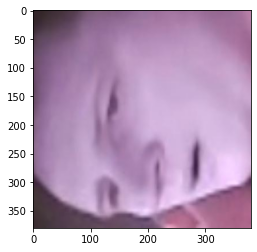

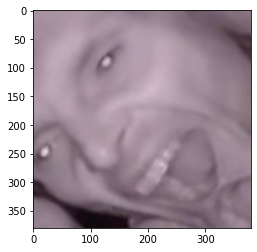

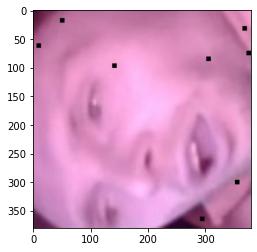

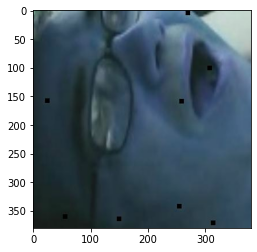

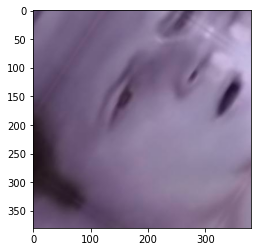

...

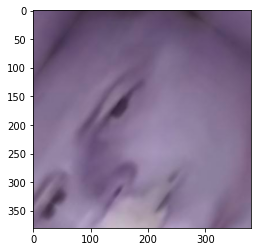

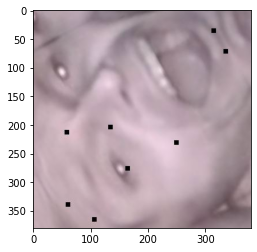

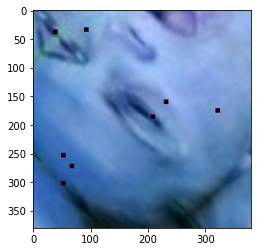

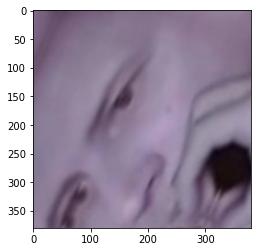

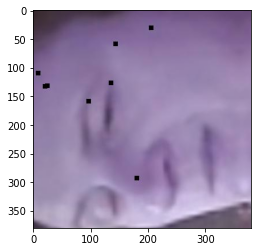

In [ ]:
for im_f in os.listdir('/content/transformed/'):
    im_bgr = cv2.imread('/content/transformed/'+ im_f)
    plt.imshow(im_bgr)
    plt.show()

In [ ]:
del model, optimizer, train_loader, val_loader, scaler, scheduler
torch.cuda.empty_cache()

In [ ]:
# INTERFENCE

if __name__ == '__main__':
     # for training only, need nightly build pytorch

    seed_everything(CFG['seed'])
    
    folds = StratifiedKFold(n_splits=CFG['fold_num']).split(np.arange(train.shape[0]), train.label.values)
    
    for fold, (trn_idx, val_idx) in enumerate(folds):
        # we'll train fold 0 first
        # if fold > 0:
        #     break 

        print('Inference fold {} started'.format(fold))

        valid_ = train.loc[val_idx,:].reset_index(drop=True)
        valid_ds = YawningDataset(valid_, './yawning-detection/train/', transforms=get_inference_transforms(), output_label=False)
        
        test = pd.DataFrame()
        test['image_id'] = list(os.listdir('./yawning-detection/test/'))
        test_ds = YawningDataset(test, './yawning-detection/test/', transforms=get_inference_transforms(), output_label=False)
        
        val_loader = torch.utils.data.DataLoader(
            valid_ds, 
            batch_size=CFG['valid_bs'],
            num_workers=CFG['num_workers'],
            shuffle=False,
            pin_memory=False,
        )
        
        tst_loader = torch.utils.data.DataLoader(
            test_ds, 
            batch_size=CFG['valid_bs'],
            num_workers=CFG['num_workers'],
            shuffle=False,
            pin_memory=False,
        )

        device = torch.device(CFG['device'])
        model = YawningImgClassifier(CFG['model_arch'], train.label.nunique()).to(device)
        
        val_preds = []
        tst_preds = []
        
        #for epoch in range(CFG['epochs']-3):
        for i, epoch in enumerate(CFG['used_epochs']):    
            model.load_state_dict(torch.load('./{}_fold_{}_{}'.format(CFG['model_arch'], fold, epoch)))
            
            with torch.no_grad():
                for _ in range(CFG['tta']):
                    try:
                        val_preds += [CFG['weights'][i]/sum(CFG['weights'])/CFG['tta']*inference_one_epoch(model, val_loader, device)]
                        tst_preds += [CFG['weights'][i]/sum(CFG['weights'])/CFG['tta']*inference_one_epoch(model, tst_loader, device)]
                    except:
                        print(i)
        val_preds = np.mean(val_preds, axis=0) 
        tst_preds = np.mean(tst_preds, axis=0) 
        
        print('fold {} validation loss = {:.5f}'.format(fold, log_loss(valid_.label.values, val_preds)))
        print('fold {} validation accuracy = {:.5f}'.format(fold, (valid_.label.values==np.argmax(val_preds, axis=1)).mean()))
        
        del model
        torch.cuda.empty_cache()

Inference fold 0 started


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
100%|██████████| 92/92 [00:33<00:00,  2.79it/s]
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


fold 0 validation loss = 0.06255
fold 0 validation accuracy = 0.98227
Inference fold 1 started


100%|██████████| 92/92 [00:32<00:00,  2.82it/s]
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


fold 1 validation loss = 0.06256
fold 1 validation accuracy = 0.97997
Inference fold 2 started


100%|██████████| 92/92 [00:32<00:00,  2.79it/s]

fold 2 validation loss = 0.05376
fold 2 validation accuracy = 0.98626


In [ ]:
prob_tst_preds = []
for i, j in tst_preds:
    prob = j / (i+j) # вероятность для 1
    prob_tst_preds.append(prob)
prob_tst_preds_arr = np.array(prob_tst_preds)

NameError: ignored

In [ ]:
percent47 = np.percentile(prob_tst_preds_arr, 47.078)
percent_rounder = np.vectorize(lambda x: 0 if x <= percent47 else 1)
preds_class_rnd_by_percent47 = percent_rounder(prob_tst_preds_arr).astype(int)
preds_class_rnd_by_percent47

array([1, 1, 1, ..., 0, 1, 1])

In [ ]:
test['label'] = preds_class_rnd_by_percent47
test['image_id'] = test['image_id'].apply(lambda s: s[5:])
test.head()

,image_id,label
0,test\123456 (956).jpg,1
1,test\123456 (3983).jpg,1
2,test\1234567 (50).jpg,1
3,test\123456 (505).jpg,0
4,test\1234567 (1122).jpg,0


In [ ]:
test.to_csv('./yawning-detection/submission4.csv', index=False)